<a href="https://colab.research.google.com/github/PrasunDatta/adorsho-praniSheba_Preprocessing-Pipeline-of-Muzzle-Data-of-Cow/blob/main/PreprocessingNotebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Drive Mount**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount = True)

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data
!pwd

[Errno 2] No such file or directory: '/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data'
/content
/content


In [ ]:
!ls

gdrive	sample_data


# **Imports**

In [ ]:
import argparse
import time
import cv2
import os
from PIL import Image
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
from skimage import feature
import shutil

# **OpenCV Super-resolution Implementation**

In [ ]:
#super_res_image.py
# import the necessary packages
import argparse
import time
import cv2
import os
# construct the argument parser and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-m", "--model", required=True,
	help="path to super resolution model")
ap.add_argument("-i", "--image", required=True,
	help="path to input image we want to increase resolution of")
args = vars(ap.parse_args())

In [ ]:
# extract the model name and model scale from the file path
modelName = args["model"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale = args["model"].split("_x")[-1]
modelScale = int(modelScale[:modelScale.find(".")])

In [ ]:
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(
	args["model"]))
print("[INFO] model name: {}".format(modelName))
print("[INFO] model scale: {}".format(modelScale))
sr = cv2.dnn_superres.DnnSuperResImpl_create()
sr.readModel(args["model"])
sr.setModel(modelName, modelScale)

In [ ]:
# load the input image from disk and display its spatial dimensions
image = cv2.imread(args["image"])
print("[INFO] w: {}, h: {}".format(image.shape[1], image.shape[0]))
# use the super resolution model to upscale the image, timing how
# long it takes
start = time.time()
upscaled = sr.upsample(image)
end = time.time()
print("[INFO] super resolution took {:.6f} seconds".format(
	end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled.shape[1],
	upscaled.shape[0]))

In [ ]:
# resize the image using standard bicubic interpolation
start = time.time()
bicubic = cv2.resize(image, (upscaled.shape[1], upscaled.shape[0]),
	interpolation=cv2.INTER_CUBIC)
end = time.time()
print("[INFO] bicubic interpolation took {:.6f} seconds".format(
	end - start))

In [ ]:
# show the original input image, bicubic interpolation image, and
# super resolution deep learning output
cv2.imshow("Original", image)
cv2.imshow("Bicubic", bicubic)
cv2.imshow("Super Resolution", upscaled)
cv2.waitKey(0)

In [ ]:
$ python super_res_image.py --model models/EDSR_x4.pb --image examples/adrian.png
# [INFO] loading super resolution model: models/EDSR_x4.pb
# [INFO] model name: edsr
# [INFO] model scale: 4
# [INFO] w: 100, h: 100
# [INFO] super resolution took 1.183802 seconds
# [INFO] w: 400, h: 400
# [INFO] bicubic interpolation took 0.000565 seconds

In [ ]:
$ python super_res_image.py --model models/EDSR_x4.pb --image examples/adrian.png

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

In [ ]:
%matplotlib inline

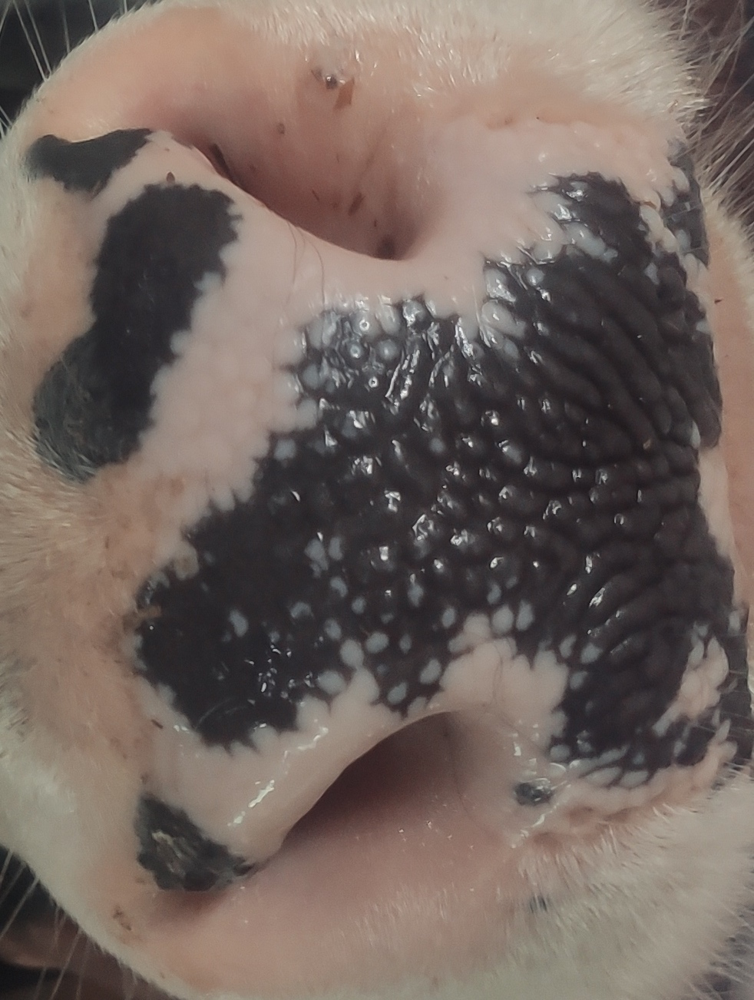

In [ ]:
# Read image
img = Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data/017/017_001.jpg')
# img = np.array(img) 
# Output Images
img
#  img = np.array(Image.open('emma_stone.jpg'))
# plt.figure(figsize=(8,8))
# plt.imshow(img)



In [ ]:
print(img.format)
 
# prints mode of image
print(img.mode)

JPEG
RGB


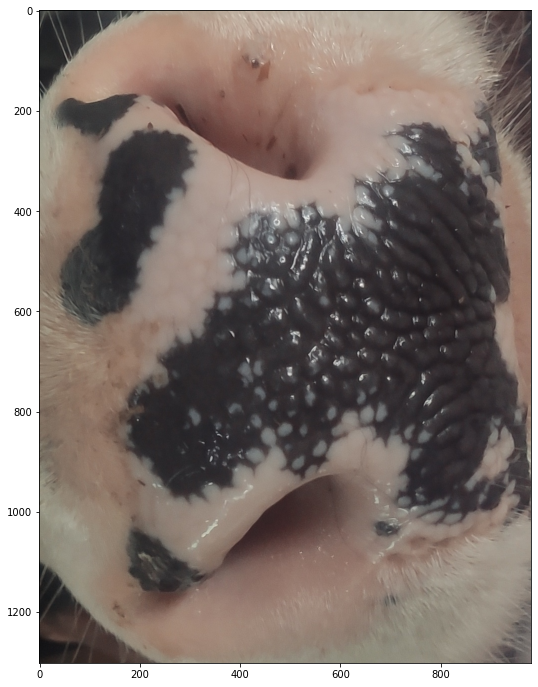

In [ ]:
img = Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data/017/017_001.jpg')
img = np.array(img) 
plt.figure(figsize=(15,12))
plt.imshow(img)

In [ ]:
print('# of dims: ',img.ndim)     # dimension of an image
print('Img shape: ',img.shape)    # shape of an image
print('Dtype: ',img.dtype)
print(img[10, 10])                # pixel value at [R, G, B]
print(img[:, :, 2].min())  

# of dims:  3
Img shape:  (1302, 982, 3)
Dtype:  uint8
[88 89 84]
15


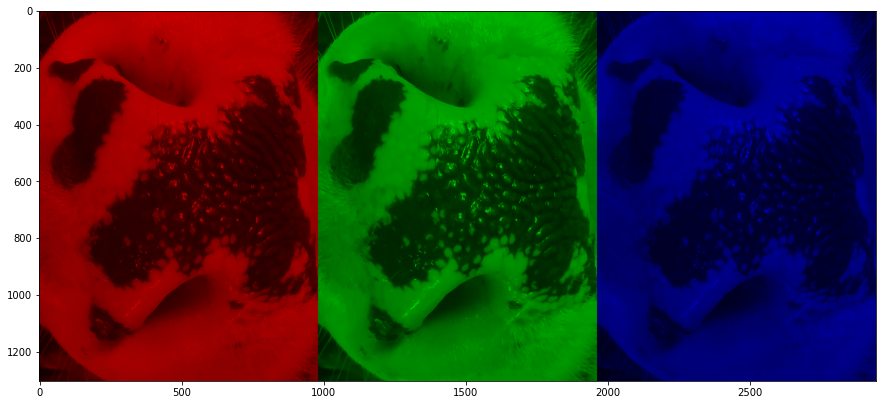

In [ ]:
img = np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data/017/017_001.jpg'))
img_R, img_G, img_B = img.copy(), img.copy(), img.copy()
img_R[:, :, (1, 2)] = 0
img_G[:, :, (0, 2)] = 0
img_B[:, :, (0, 1)] = 0
img_rgb = np.concatenate((img_R,img_G,img_B), axis=1)
plt.figure(figsize=(15, 15))
plt.imshow(img_rgb)

In [ ]:
%cd /content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba
!ls

/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba
Adorsho_Pranisheba.ipynb  Data	models	super_res_image.py


In [ ]:
!pip install opencv-contrib-python

In [ ]:
!pip uninstall opencv-python
!pip uninstall opencv-contrib-python
!pip3 install opencv-contrib-python

[INFO] loading super resolution model: models/LapSRN_x8.pb
[INFO] model name: lapsrn
[INFO] model scale: 8
875
[INFO] w: 438, h: 572
[INFO] super resolution took 101.032157 seconds
[INFO] w: 3504, h: 4576
[INFO] bicubic interpolation took 0.031345 seconds


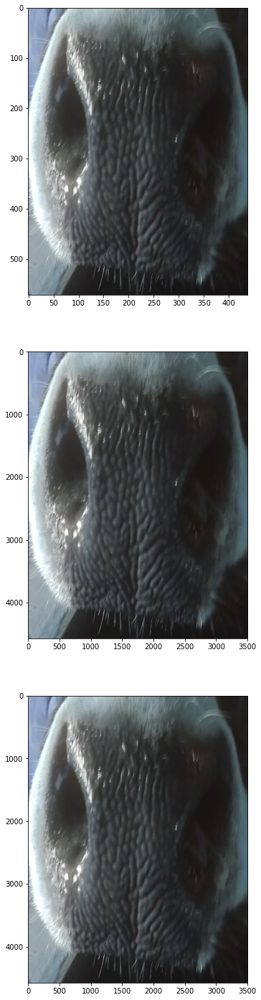

In [ ]:
import os
model  ="models/LapSRN_x8.pb"
data= "Data/019/019_004.jpg"

# extract the model name and model scale from the file path
modelName = model.split(os.path.sep)[-1].split("_")[0].lower()
modelScale = model.split("_x")[-1]
modelScale = int(modelScale[:modelScale.find(".")])

# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(
	model))
print("[INFO] model name: {}".format(modelName))
print("[INFO] model scale: {}".format(modelScale))
sr = cv2.dnn_superres.DnnSuperResImpl_create()
sr.readModel(model)
sr.setModel(modelName, modelScale)


# load the input image from disk and display its spatial dimensions
or_image = cv2.imread(data)
print(or_image.shape[0])
image = cv2.resize(or_image, (round(or_image.shape[0]*0.5), round(or_image.shape[1]*0.5)))

print("[INFO] w: {}, h: {}".format(image.shape[1], image.shape[0]))
# use the super resolution model to upscale the image, timing how
# long it takes
start = time.time()
upscaled = sr.upsample(image)
end = time.time()
print("[INFO] super resolution took {:.6f} seconds".format(
	end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled.shape[1],
	upscaled.shape[0]))



# resize the image using standard bicubic interpolation
start = time.time()
bicubic = cv2.resize(image, (upscaled.shape[1], upscaled.shape[0]),
	interpolation=cv2.INTER_CUBIC)
end = time.time()
print("[INFO] bicubic interpolation took {:.6f} seconds".format(
	end - start))

from matplotlib import pyplot as plt
lis=[image,bicubic,upscaled]
f,axs=plt.subplots(3,1,figsize=(25,25)) #ROW,COLUMN
axs[0].imshow(lis[0])
axs[1].imshow(lis[1])
axs[2].imshow(lis[2])

In [ ]:
!python super_res_image.py --model models/LapSRN_x8.pb --image Data/019/019_005.jpg

[INFO] loading super resolution model: models/LapSRN_x8.pb
[INFO] model name: lapsrn
[INFO] model scale: 8
833
[INFO] w: 416, h: 619
[INFO] super resolution took 105.265071 seconds
[INFO] w: 3328, h: 4952
[INFO] bicubic interpolation took 0.032209 seconds


# **Canny Edge Detector**

In [ ]:
or_img = np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/image_019_005.jpeg').convert('L'))

up_img =np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/upscaled_019_005.jpeg').convert('L'))

In [ ]:
or_img.shape

(619, 416)

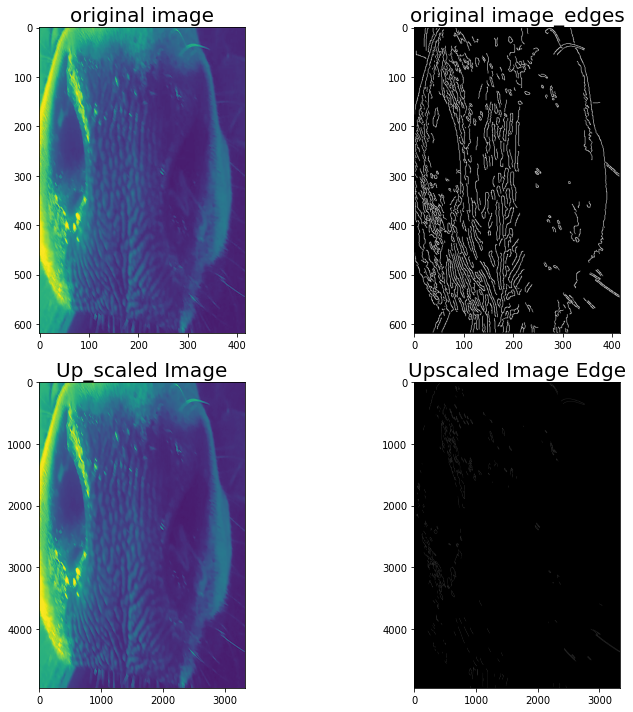

In [ ]:
# Compute the Canny filter for two values of sigma
edges_or_img = feature.canny(or_img)
edges_up_img = feature.canny(up_img)

edges_or_img_arr_dir = asarray(edges_or_img)
save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_dir.npy",edges_or_img_arr_dir)






# display results
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,10))

ax[0][0].imshow(or_img)
ax[0][0].set_title('original image', fontsize=20)

ax[0][1].imshow(edges_or_img,cmap = "gray")
ax[0][1].set_title('original image_edges', fontsize=20)

ax[1][0].imshow(up_img)
ax[1][0].set_title('Up_scaled Image', fontsize=20)

ax[1][1].imshow(edges_up_img,cmap = "gray")
ax[1][1].set_title('Upscaled Image Edge', fontsize=20)



fig.tight_layout()
plt.show()

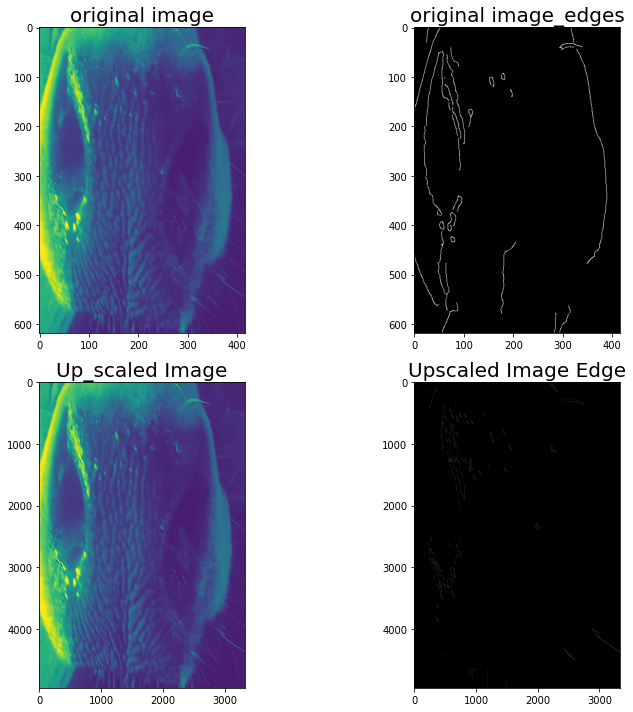

In [ ]:
# Compute the Canny filter for two values of sigma
edges_or_img = feature.canny(or_img,sigma = 3) 
edges_up_img = feature.canny(up_img,sigma = 3)

# display results
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,10))

ax[0][0].imshow(or_img)
ax[0][0].set_title('original image', fontsize=20)

ax[0][1].imshow(edges_or_img,cmap = "gray")
ax[0][1].set_title('original image_edges', fontsize=20)

ax[1][0].imshow(up_img)
ax[1][0].set_title('Up_scaled Image', fontsize=20)

ax[1][1].imshow(edges_up_img,cmap = "gray")
ax[1][1].set_title('Upscaled Image Edge', fontsize=20)



fig.tight_layout()
plt.show()

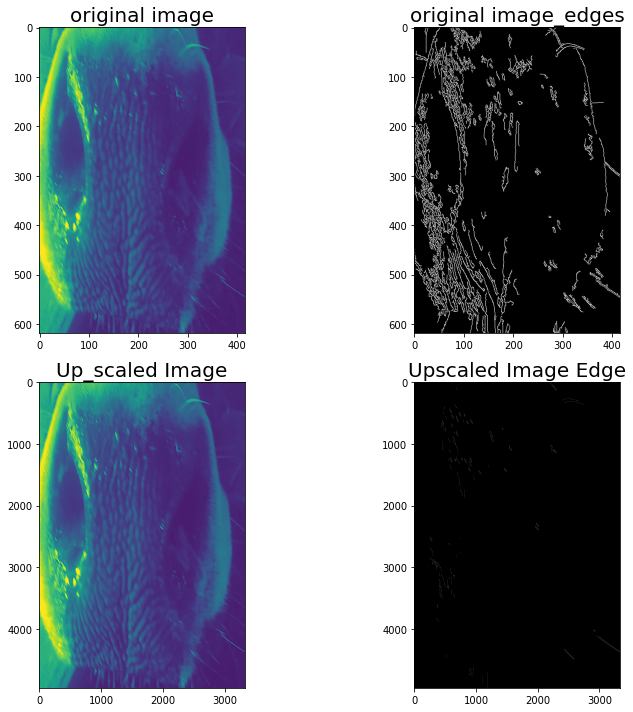

In [ ]:
or_img = np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/image_019_005.jpeg').convert('L'))

up_img =np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/upscaled_019_005.jpeg').convert('L'))

edge_or = cv2.Canny(or_img,30,150)
edge_up = cv2.Canny(up_img, 30, 150)

# display results
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,10))

ax[0][0].imshow(or_img)
ax[0][0].set_title('original image', fontsize=20)

ax[0][1].imshow(edge_or,cmap = "gray")
ax[0][1].set_title('original image_edges', fontsize=20)

ax[1][0].imshow(up_img)
ax[1][0].set_title('Up_scaled Image', fontsize=20)

ax[1][1].imshow(edge_up,cmap = "gray")
ax[1][1].set_title('Upscaled Image Edge', fontsize=20)



fig.tight_layout()
plt.show()




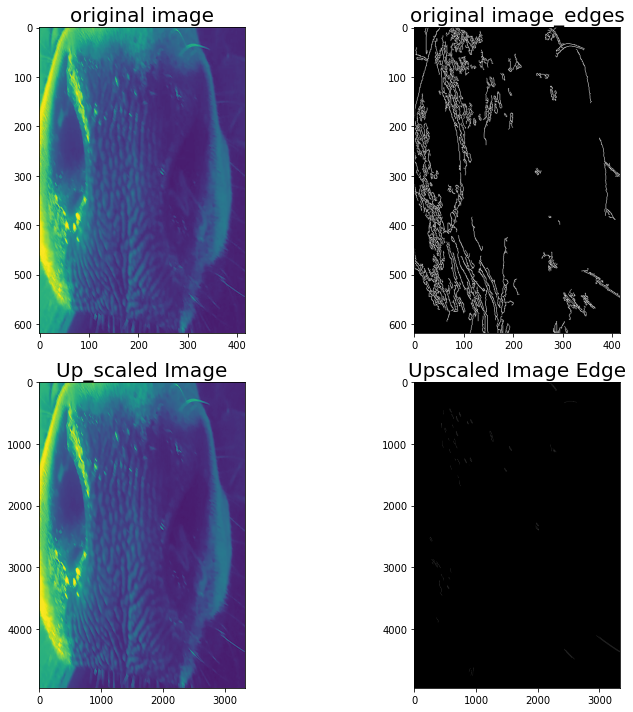

In [ ]:
or_img = np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/image_019_005.jpeg').convert('L'))

up_img =np.array(Image.open('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/upscaled_019_005.jpeg').convert('L'))

edge_or = cv2.Canny(or_img,10,200)
edge_up = cv2.Canny(up_img, 10, 200)

# display results
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,10))

ax[0][0].imshow(or_img)
ax[0][0].set_title('original image', fontsize=20)

ax[0][1].imshow(edge_or,cmap = "gray")
ax[0][1].set_title('original image_edges', fontsize=20)

ax[1][0].imshow(up_img)
ax[1][0].set_title('Up_scaled Image', fontsize=20)

ax[1][1].imshow(edge_up,cmap = "gray")
ax[1][1].set_title('Upscaled Image Edge', fontsize=20)



fig.tight_layout()
plt.show()




In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
 
loaded_image = cv2.imread("image.jpg")
loaded_image = cv2.cvtColor(loaded_image,cv2.COLOR_BGR2RGB)
 
gray_image = cv2.cvtColor(loaded_image,cv2.COLOR_BGR2GRAY)
 
edged_image = cv2.Canny(gray_image, threshold1=30, threshold2=100)
 
 
plt.figure(figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(loaded_image,cmap="gray")
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(gray_image,cmap="gray")
plt.axis("off")
plt.title("GrayScale Image")
plt.subplot(1,3,3)
plt.imshow(edged_image,cmap="gray")
plt.axis("off")
plt.title("Canny Edge Detected Image")
plt.show()

In [ ]:
wide = cv2.Canny(blurred, 10, 200)
mid = cv2.Canny(blurred, 30, 150)
tight = cv2.Canny(blurred, 240, 250)


# **Deblur/Sharpen An Image**

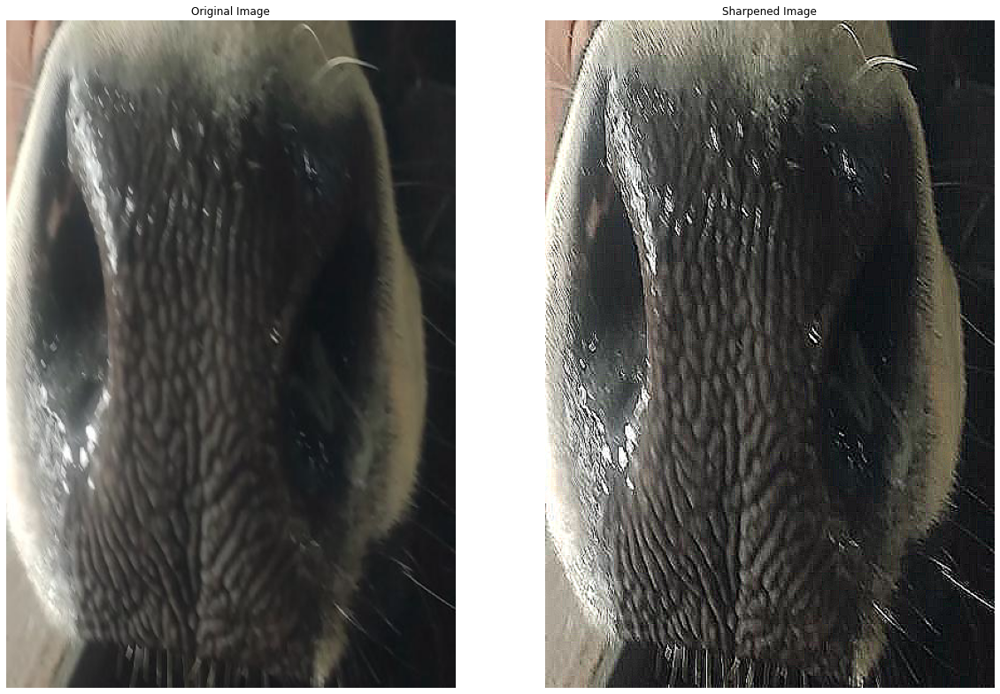

In [ ]:
import cv2
import numpy as np

or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/image_019_005.jpeg')
sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(or_image)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(sharpen)
plt.axis("off")
plt.title("Sharpened Image")

plt.show()

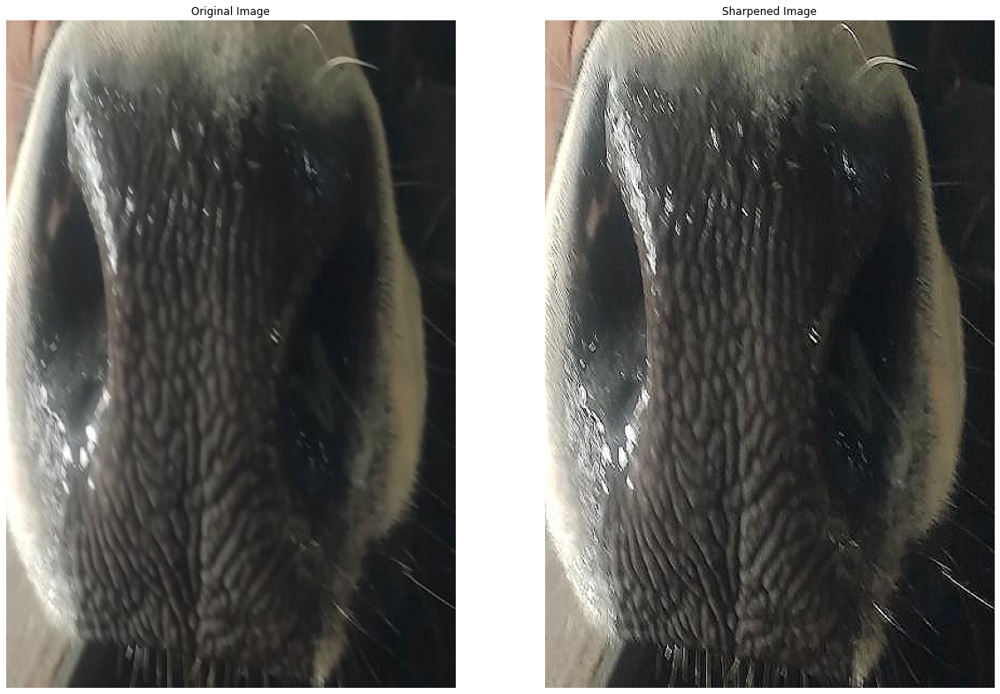

In [ ]:
import cv2
import numpy as np

or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/image_019_005.jpeg')
sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
plt.imshow(or_image)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(sharpen)
plt.axis("off")
plt.title("Sharpened Image")

plt.show()

# kernel = np.array([[0, -1, 0],
#                    [-1, 5,-1],
#                    [0, -1, 0]])

# **Histogram Equalization**

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt 

(824, 515)


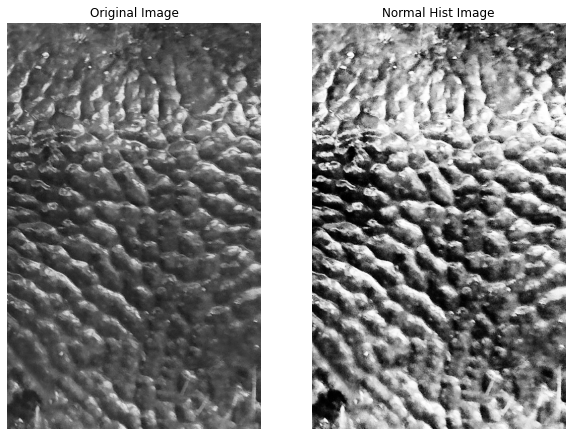

In [ ]:
or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/041_105.jpg')
gray_img = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)
equ_img = cv2.equalizeHist(gray_img)
print(equ_img.shape)
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(gray_img,cmap = "gray")
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(equ_img,cmap = "gray")
plt.axis("off")
plt.title("Normal Hist Image")

plt.show()



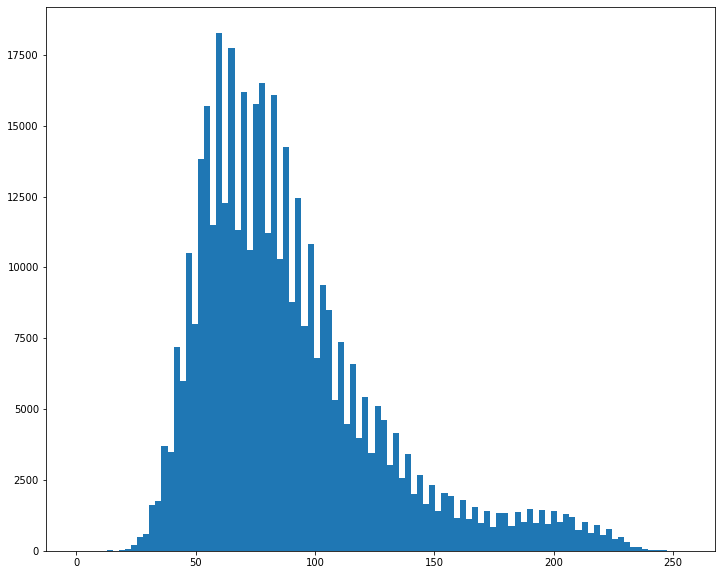

In [ ]:
plt.figure(figsize=(12,10))
n, bins, patches = plt.hist(gray_img.flat, bins=100, range=(0, 255))

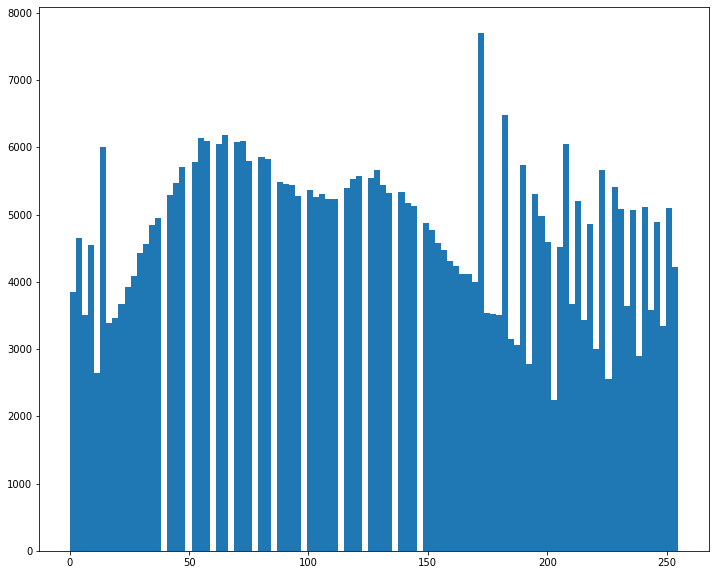

In [ ]:
plt.figure(figsize=(12,10))
n, bins, patches = plt.hist(equ_img.flat, bins=100, range=(0, 255))

(824, 515)


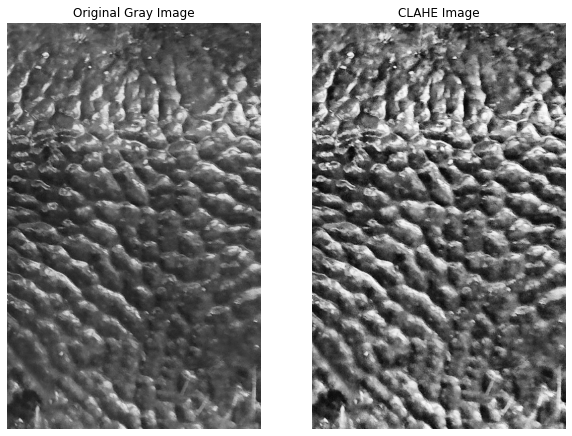

In [ ]:
or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/041_105.jpg')
gray_img = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)

clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8)) ## need to explore ## will enhance noise also
cl_img = clahe.apply(gray_img)


print(cl_img.shape)
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(gray_img,cmap = "gray")
plt.title("Original Gray Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(cl_img,cmap = "gray")
plt.axis("off")
plt.title("CLAHE Image")

plt.show()





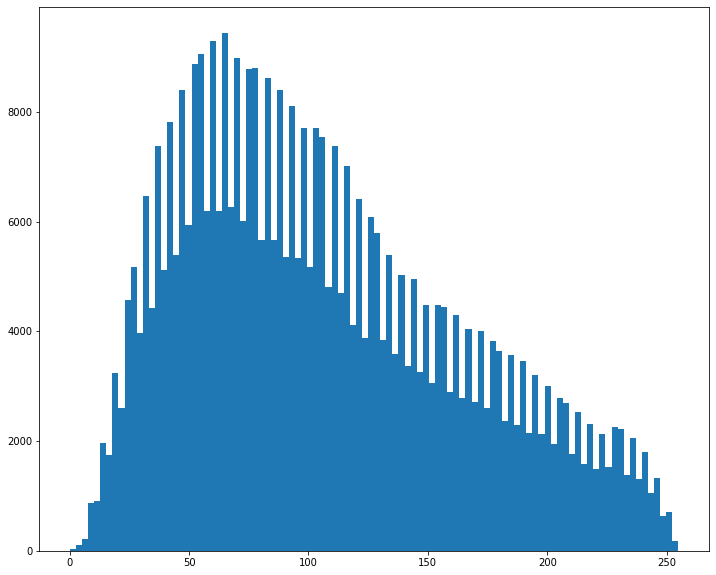

In [ ]:
plt.figure(figsize=(12,10))
n, bins, patches = plt.hist(cl_img.flat, bins=100, range=(0, 255))

# **Sharpen+CLAHE+Edge**

In [ ]:
!change github.com to githubtocolab.com

/bin/bash: change: command not found


# **## Need to explore Edge Detectors**
# **## Adaptive Edge Detector/filter**
# **## Brightness(Reflection)**

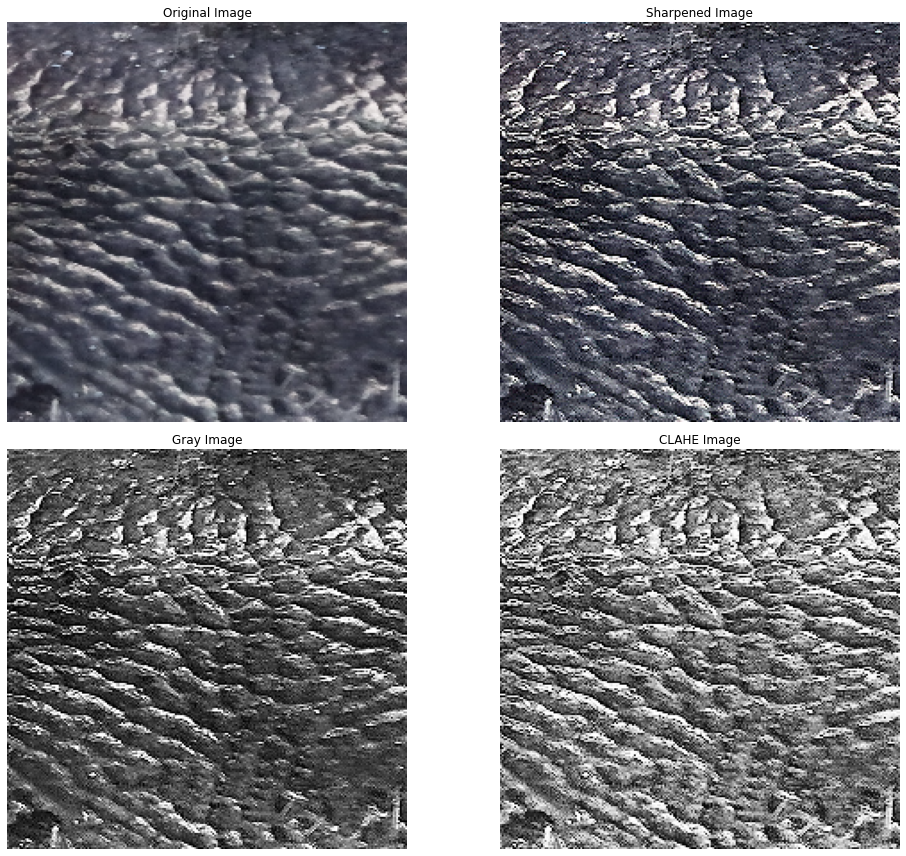

In [ ]:
from numpy import asarray
from numpy import save


or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/041_105.jpg')
or_image = cv2.resize(or_image, )
or_img_gray = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)

or_img_gray = asarray(or_img_gray)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/or_img_gray.npy",or_img_gray)

# data = asarray([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
# # save to npy file
# save('data.npy', data)


sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
cl_img = clahe.apply(gray_img)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/CLAHE_output.npy",cl_img)
# edges_or_img = feature.canny(cl_img)
# edges_or_img_arr = asarray(edges_or_img)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_CLAHE.npy",edges_or_img_arr)
# plt.im

# display results
plt.figure(figsize=(15,12))
plt.subplot(2,2,1)
plt.imshow(or_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(sharpen)
plt.axis("off")
plt.title("Sharpened Image")

plt.subplot(2,2,3)
plt.imshow(gray_img,cmap = "gray")
plt.axis("off")
plt.title("Gray Image")

plt.subplot(2,2,4)
plt.imshow(cl_img,cmap = "gray")
plt.axis("off")
plt.title("CLAHE Image")

# plt.subplot(3,2,5)
# plt.imshow(edges_or_img,cmap = "gray")
# plt.axis("off")
# plt.title("Canny Image")

plt.tight_layout()
plt.show()


In [ ]:
from numpy import asarray
from numpy import save


or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/train/009/009_003.jpg')
or_img_gray = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)
print(or_img_gray.shape)
# or_img_gray = asarray(or_img_gray)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/or_img_gray.npy",or_img_gray)

# data = asarray([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
# # save to npy file
# save('data.npy', data)


sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
cl_img = clahe.apply(gray_img)
print(cl_img.shape)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/CLAHE_output.npy",cl_img)
edges_or_img = feature.canny(cl_img) ### time to 
edges_or_img_arr = asarray(edges_or_img)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_CLAHE.npy",edges_or_img_arr)


# # display results
# plt.figure(figsize=(15,12))
# plt.subplot(3,2,1)
# plt.imshow(or_image)
# plt.title("Original Image")
# plt.axis("off")

# plt.subplot(3,2,2)
# plt.imshow(sharpen)
# plt.axis("off")
# plt.title("Sharpened Image")

# plt.subplot(3,2,3)
# plt.imshow(gray_img,cmap = "gray")
# plt.axis("off")
# plt.title("Gray Image")

# plt.subplot(3,2,4)
# plt.imshow(cl_img,cmap = "gray")
# plt.axis("off")
# plt.title("CLAHE Image")

# plt.subplot(3,2,5)
# plt.imshow(edges_or_img,cmap = "gray")
# plt.axis("off")
# plt.title("Canny Image")

# plt.tight_layout()
# plt.show()


(793, 577)
(793, 577)


In [ ]:
from numpy import asarray
from numpy import save

data = asarray([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
# save to npy file
save('data.npy', data)

# load array
data = load('data.npy')
# print the array
print(data)


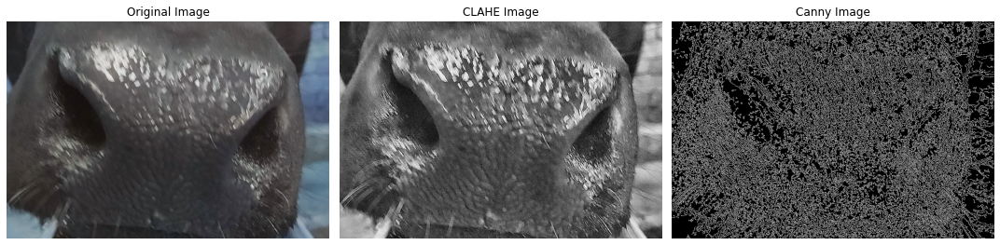

In [ ]:
or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data/011/011_009.jpg')

sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit = 2.0, tileGridSize=(10,10))
cl_img = clahe.apply(gray_img)

edges_or_img = feature.canny(cl_img)

# display results
plt.figure(figsize=(15,12))
plt.subplot(1,3,1)
plt.imshow(or_image)
plt.title("Original Image")
plt.axis("off")

# plt.subplot(3,2,2)
# plt.imshow(sharpen)
# plt.axis("off")
# plt.title("Sharpened Image")

# plt.subplot(3,2,3)
# plt.imshow(gray_img,cmap = "gray")
# plt.axis("off")
# plt.title("Gray Image")

plt.subplot(1,3,2)
plt.imshow(cl_img,cmap = "gray")
plt.axis("off")
plt.title("CLAHE Image")

plt.subplot(1,3,3)
plt.imshow(edges_or_img,cmap = "gray")
plt.axis("off")
plt.title("Canny Image")

plt.tight_layout()
plt.show()


# **SSIM & MSE**

In [ ]:
# from skimage.measure import compare_ssim as ssim 

#from skimage.measure import structural_similarity as ssim
# from skimage import measure
from skimage.metrics import structural_similarity as ssim
#best method to compare images. Measures structural similarities index between two images
import matplotlib.pyplot as plt
%matplotlib inline 
import numpy as np
#to calculate Mean Squared Error
import cv2
#To load imaged. From module OpenCV

In [ ]:
def mse(imageA, imageB):
    err= np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return err

In [ ]:
def compare_image(imageA, imageB,title):
    m= mse(imageA, imageB)
    s= ssim(imageA, imageB)
    fig= plt.figure(figsize = (15,10))
    plt.suptitle(title + "\n MSE: %.2f, SSIM: %.2f" % (m, s))    
    # show first image
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(imageA, cmap = plt.cm.gray)
    plt.axis("off")
    # show the second image
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(imageB, cmap = plt.cm.gray)
    plt.axis("off")
    # plt.tight_layout()
    plt.show()

In [ ]:
from numpy import load

or_img_gray = load("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/or_img_gray.npy")
print(or_img_gray.shape)
edges_or_img_arr_dir = load("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_dir.npy")
print(edges_or_img_arr_dir.shape)
edges_or_img_arr_CLAHE = load("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_CLAHE.npy")
print(edges_or_img_arr_CLAHE.shape)
CLAHE_op = load("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/CLAHE_output.npy")
# load array
# data = load('data.npy')
# # print the array
# print(data)

# compare_image(dog_1, dog_1, 'same dogs')

(619, 416)
(619, 416)
(619, 416)


In [ ]:
# from numpy import asarray
# from numpy import save


# or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/train/009/009_003.jpg')
# or_img_gray = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)
# or_img_gray = asarray(or_img_gray)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/or_img_gray.npy",or_img_gray)

# # data = asarray([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
# # # save to npy file
# # save('data.npy', data)


# sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
# sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

# gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
# clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
# cl_img = clahe.apply(gray_img)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/CLAHE_output.npy",cl_img)
# edges_or_img = feature.canny(cl_img)
# edges_or_img_arr = asarray(edges_or_img)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_CLAHE.npy",edges_or_img_arr)

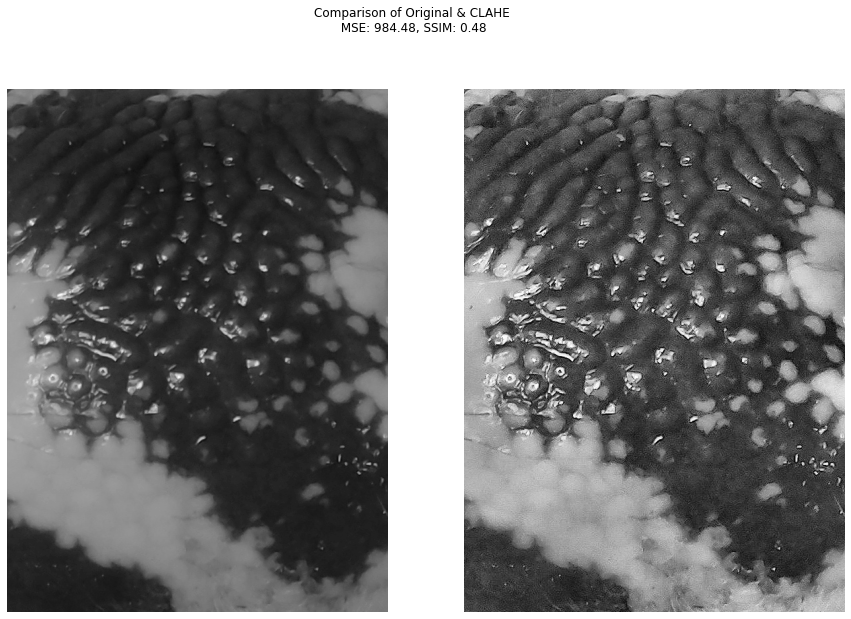

In [ ]:
compare_image(or_img_gray,cl_img,"Comparison of Original & CLAHE")


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  This is separate from the ipykernel package so we can avoid doing imports until


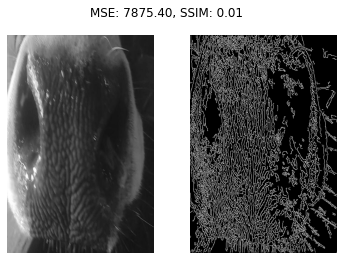

In [ ]:
compare_image(or_img_gray,edges_or_img_arr_CLAHE,'Comparison of Or_gray vs Edge Direct')


In [ ]:
#s = ssim(imageA, imageB)
s = measure.compare_ssim(imageA, imageB)

# **Preprocessing Pipeline On**
# *Muzzle Data*

In [ ]:
!pip install pyunpack

In [ ]:
!pip install patool

     |████████████████████████████████| 77 kB 2.1 MB/s 


In [ ]:
%cd /content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba

/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba


In [ ]:
from pyunpack import Archive
Archive('muzzle_data_re/muzzle_data_re.zip').extractall("muzzle_data_re/")

In [ ]:
from zipfile import ZipFile

# Create a ZipFile Object and load sample.zip in it
with ZipFile('muzzle_data_re/muzzle_data_re.zip', 'r') as zipObj:
   # Get a list of all archived file names from the zip
   listOfFileNames = zipObj.namelist()
   names = [info.filename for info in zipObj.infolist() if info.is_dir()]
  #  print(names)
   # Iterate over the file names
  #  for fileName in listOfFileNames:
    #  print(fileName)     
       # Check filename endswith csv
      #  if fileName.endswith('.csv'):
      #      # Extract a single file from zip
      #      zipObj.extract(fileName, 'temp_csv')

In [ ]:
import glob

base_path = "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2"
crop_muzzle_pth = os.path.join(base_path,"Cropped_muzzle_image")
processed_image = "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image"



# train_pth = base_path +'/train' 
# valid_pth = base_path+'/validation'

train_folder = sorted(os.listdir(crop_muzzle_pth))
print(train_folder)
# for i in train_folder:
#   os.mkdir(os.path.join(processed_image,i))
# os.mkdir(os.path.join)
train_imgs = []
for index,folder in enumerate(train_folder):
  train_img_pth = sorted(glob.glob(crop_muzzle_pth +'/'+ train_folder[index]+'/*'))
  train_imgs.append(train_img_pth)
print(train_imgs) 

['2_000002', '2_000014', '2_000015', '2_000016', '2_000018', '2_000019', '2_000020', '2_000021', '2_000022', '2_000023', '2_000025', '2_000027', '2_000030', '2_000031', '2_000032', '2_000034', '2_000035', '2_000037', '2_000038', '2_000039', '2_000040', '2_000041', '2_000042', '2_000043', '2_000044', '2_000045', '2_000046', '2_000047', '2_000048', '2_000049', '2_000051', '2_000052', '2_000053', '2_000057', '2_000058', '2_000060', '2_000061', '2_000062', '2_000063', '2_000064', '2_000065', '2_000066', '2_000069', '2_000070', '2_000071', '2_000073', '2_000074', '2_000075', '2_000076', '2_000077', '2_000078', '2_000079', '2_000080', '2_000081', '2_000082', '2_000083', '2_000084', '2_000085', '2_000086', '2_000087', '2_000089', '2_000090', '2_000091', '2_000092', '2_000093', '2_000094', '2_000095', '2_000096']
[["/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_004.jpg", "/content/gdrive/MyDrive/PrasunFolder/Adorsho_

In [ ]:
# import re
# # StringRegex = re.compile(r'_CLAHE')
# # i =0
# train_imgs_new =[]
# for i in train_imgs[:][:]:
#   for j in i:
#     extname = os.path.splitext(j)
#     if str(extname[1]) == ".png":
#       continue
#     else: 

#       train_imgs_new.append(j)
# # print(train_imgs)
# # mo = StringRegex.search()
# # if mo.group() == '_CLAHE':



In [ ]:
train_imgs_new

In [ ]:
# base_path = "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re"
# valid_pth = base_path+'/validation'

# valid_folder = sorted(os.listdir(valid_pth))
# print(valid_folder)
# valid_imgs = []
# for i in range(len(valid_folder)):
#   valid_img_pth = sorted(glob.glob(valid_pth +'/'+ valid_folder[i]+'/*'))

#   valid_imgs.append(valid_img_pth)
# valid_imgs

In [ ]:
train_imgs

[["/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_004.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_005.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_006.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_007.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_008.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_009.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Cropped_muzzle_image/2_000002/2_000002_010.jpg",
  "/content/gdrive/MyDrive/PrasunFolder/A

In [ ]:
for i in train_imgs:

  for k in range(len(i)):
    folder,tail = os.path.split(i[k])
    folder_1,tail_1 = os.path.split(folder)
    name ,ext = os.path.splitext(tail)
    or_image = cv2.imread(i[k]) 
    sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
    sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)
    
    gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
    cl_img = clahe.apply(gray_img)
    path_folder = os.path.join(processed_image,tail_1)
    path_img = os.path.join(path_folder,name+"_CLAHE.png")
    print(path_img)
    shutil.copy(i[k] ,path_folder)
    plt.imsave(path_img,cl_img,cmap ="gray")





/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111948_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111949_1_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111950_1_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111952_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111956_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111957_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Cow's_data_Collection_for_V2/Processed_image/001/IMG_20220717_111958_1_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pran

In [ ]:
m =0
mean_s =[]
for i in train_imgs_new:
  # total_s =[]
    # print(i[k])
  folder,tail = os.path.split(i)
  name ,ext = os.path.splitext(tail)
    # print(folder)
  or_image = cv2.imread(i)
  image_in = cv2.cvtColor(or_image , cv2.COLOR_BGR2RGB)
  h,s,v = cv2.split(cv2.cvtColor(image_in,cv2.COLOR_RGB2HSV))
  nonSat = s < 180 #Find all pixels that are not very saturated

    #Slightly decrease the area of the non-saturated pixels by an eroding operation
  disk = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
  nonSat = cv2.erode(nonSat.astype(np.uint8), disk)

    #set all brightness values, where the pixels are still saturated to 0
  v2 = v.copy()
  v2[nonSat ==0] = 0
    
  glare = v2 > 230 #fliter out bright pixels
    #slightly increase the area of each pixel
  glare = cv2.dilate(glare.astype(np.uint8), disk)
    # glare = cv2.dilate(glare.astype(np.uint8),disk)
  corrected = cv2.inpaint(image_in,glare,5,cv2.INPAINT_NS)

    
    # or_img_gray = cv2.cvtColor(corrected , cv2.COLOR_BGR2GRAY)
    # or_img_gray = numpy.asarray(or_img_gray)
    
  sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
  sharpen = cv2.filter2D(corrected, -1, sharpen_kernel)
    
  gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
  clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
  cl_img = clahe.apply(gray_img)
  path = os.path.join(folder,name+"_Brightness_CLAHE.png")
  print(path)
    # break  
  plt.imsave(path,cl_img,cmap ="gray")
    
    # mean_sq_er= mse(or_img_gray,cl_img)
    # s= ssim(or_img_gray,cl_img)
    # total_s.append(s)
    # # plt.suptitle(title + "\n MSE: %.2f, SSIM: %.2f" % (m, s))  
    # print ("folder {0:.2f} image {1:.2f} MSE: {2:.4f} & SSIM {3:.4f}".format(m+1,k+1,mean_sq_er,s))  
  
  # mean = np.mean(total_s)
  # mean_s.append(mean)
  # print(f"folder {m+1} 's mean SSIM {mean_s[m]}")
  # m = m+1


# or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/train/009/009_003.jpg')
# or_img_gray = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)
# or_img_gray = asarray(or_img_gray)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/or_img_gray.npy",or_img_gray)

# # data = asarray([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
# # # save to npy file
# # save('data.npy', data)


# sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
# sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

# gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
# clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
# cl_img = clahe.apply(gray_img)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/CLAHE_output.npy",cl_img)
# edges_or_img = feature.canny(cl_img)
# edges_or_img_arr = asarray(edges_or_img)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_CLAHE.npy",edges_or_img_arr)

/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_Muzzle04/Muzzle pic_Shahjahan_10.6.22/001/IMG20220610083815_Brightness_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_Muzzle04/Muzzle pic_Shahjahan_10.6.22/001/IMG20220610083818_Brightness_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_Muzzle04/Muzzle pic_Shahjahan_10.6.22/001/IMG20220610083826_Brightness_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_Muzzle04/Muzzle pic_Shahjahan_10.6.22/001/IMG20220610083836_Brightness_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_Muzzle04/Muzzle pic_Shahjahan_10.6.22/002/IMG20220610085647_Brightness_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_Muzzle04/Muzzle pic_Shahjahan_10.6.22/002/IMG20220610085659_Brightness_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranish

In [ ]:
m =0
mean_s =[]
for i in valid_imgs:
  total_s =[]
  for k in range(len(i)):
    # print(i[k])
    folder,tail = os.path.split(i[k])
    name ,ext = os.path.splitext(tail)
    # print(folder)
    or_image = cv2.imread(i[k])
    or_img_gray = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)
    or_img_gray = asarray(or_img_gray)
    glare = v2 > 230 #fliter out bright pixels
#slightly increase the area of each pixel
glare = cv2.dilate(glare.astype(np.uint8), disk)
glare = cv2.dilate(glare.astype(np.uint8),disk)
print(glare.shape)
    
    sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
    sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)
    
    gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
    cl_img = clahe.apply(gray_img)
    path = os.path.join(folder,name+"_CLAHE.png")
    print(path)
    plt.imsave(path,cl_img,cmap ="gray")
    
    # mean_sq_er= mse(or_img_gray,cl_img)
    # s= ssim(or_img_gray,cl_img)
    # total_s.append(s)
    # # plt.suptitle(title + "\n MSE: %.2f, SSIM: %.2f" % (m, s))  
    # print ("folder {0:.2f} image {1:.2f} MSE: {2:.4f} & SSIM {3:.4f}".format(m+1,k+1,mean_sq_er,s))  
  
  # mean = np.mean(total_s)
  # mean_s.append(mean)
  # print(f"folder {m+1} 's mean SSIM {mean_s[m]}")
  # m = m+1


# or_image = cv2.imread('/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/train/009/009_003.jpg')
# or_img_gray = cv2.cvtColor(or_image, cv2.COLOR_BGR2GRAY)
# or_img_gray = asarray(or_img_gray)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/or_img_gray.npy",or_img_gray)

# # data = asarray([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
# # # save to npy file
# # save('data.npy', data)


# sharpen_kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
# sharpen = cv2.filter2D(or_image, -1, sharpen_kernel)

# gray_img = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
# clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
# cl_img = clahe.apply(gray_img)
# # save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/CLAHE_output.npy",cl_img)
# edges_or_img = feature.canny(cl_img)
# edges_or_img_arr = asarray(edges_or_img)
# save("/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/edges_or_img_arr_CLAHE.npy",edges_or_img_arr)

/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_001_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_002_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_003_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_004_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_005_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_006_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_007_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/muzzle_data_re/muzzle_data_re/validation/004/004_008_CLAHE.png
/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pra

# **Remove Glaring Effect form Image**

In [ ]:
%matplotlib inline

from pylab import *
import cv2
import os, sys
import matplotlib.pyplot as plt

In [ ]:
img_path = "/content/gdrive/MyDrive/PrasunFolder/Adorsho_Pranisheba/Data_Pranisheba/Data_muzzle03/Shahjahn vai/004/IMG20220610085834.jpg"

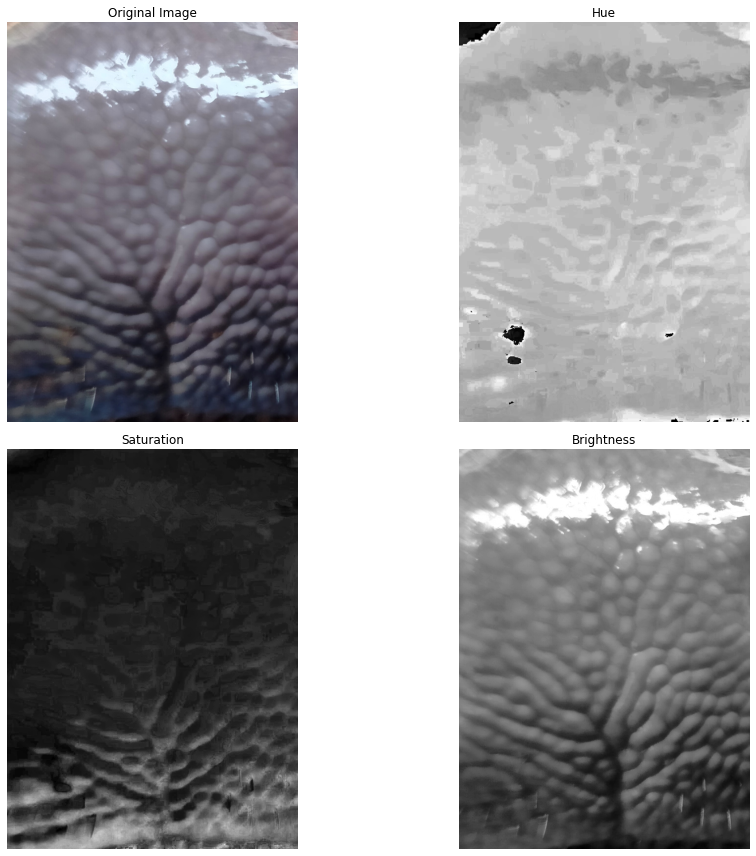

In [ ]:
image_in = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
h,s,v = cv2.split(cv2.cvtColor(image_in,cv2.COLOR_RGB2HSV))

#plot images
plt.figure(figsize=(15,12))
plt.subplot(2,2,1)
plt.imshow(image_in)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(h,cmap = "gray")
plt.axis("off")
plt.title("Hue")

plt.subplot(2,2,3)
plt.imshow(s,cmap = "gray")
plt.axis("off")
plt.title("Saturation")

plt.subplot(2,2,4)
plt.imshow(v,cmap = "gray")
plt.axis("off")
plt.title("Brightness")


plt.tight_layout()
plt.show() 


In [ ]:
print(s.shape)

(1632, 1185)


In [ ]:
sum(sum(s > 120))

11061

In [ ]:
1632*1185

1933920

Before V2 is :[[191 192 192 ... 142 142 140]
 [190 192 192 ... 145 146 143]
 [191 192 192 ... 148 150 147]
 ...
 [ 70  71  71 ...  38  38  38]
 [ 70  70  72 ...  38  38  38]
 [ 69  70  71 ...  38  38  38]]
After V2 is: [[191 192 192 ... 142 142 140]
 [190 192 192 ... 145 146 143]
 [191 192 192 ... 148 150 147]
 ...
 [ 70  71  71 ...  38  38  38]
 [ 70  70  72 ...  38  38  38]
 [ 69  70  71 ...  38  38  38]]


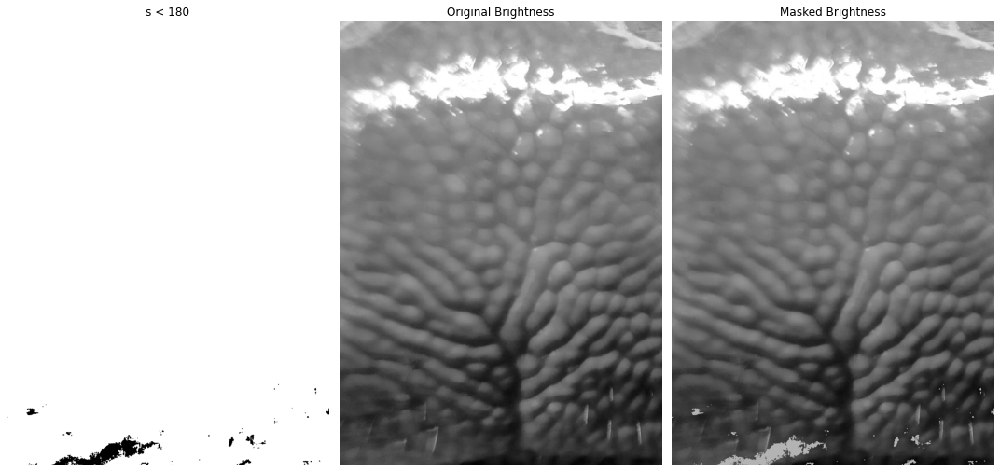

In [ ]:
nonSat = s < 120 #Find all pixels that are not very saturated

#Slightly decrease the area of the non-saturated pixels by an eroding operation
disk = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
nonSat = cv2.erode(nonSat.astype(np.uint8), disk)

#set all brightness values, where the pixels are still saturated to 0
v2 = v.copy()
print(f"Before V2 is :{v2}")

v2[nonSat ==0] = 180
print(f"After V2 is: {v2}")
#plot images
plt.figure(figsize=(15,12))
plt.subplot(1,3,1)
plt.imshow(nonSat, cmap = "gray")
plt.title("s < 180")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(v,cmap = "gray")
plt.axis("off")
plt.title("Original Brightness")

plt.subplot(1,3,3)
plt.imshow(v2,cmap = "gray")
plt.axis("off")
plt.title("Masked Brightness")


plt.tight_layout()
plt.show() 




(1632, 1185)


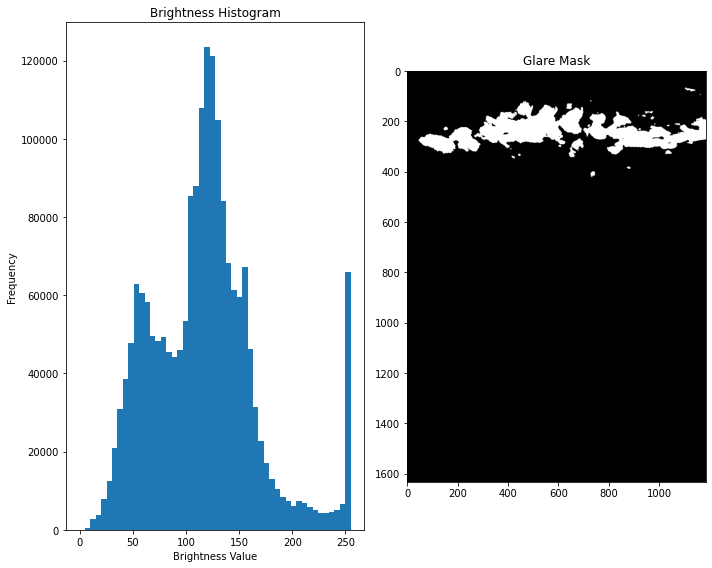

In [ ]:
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.hist(v2.flatten(), bins = 50)
plt.xlabel("Brightness Value")
plt.ylabel("Frequency")
plt.title("Brightness Histogram")
# plt.axis("off")

glare = v2 > 230 #fliter out bright pixels
#slightly increase the area of each pixel
glare = cv2.dilate(glare.astype(np.uint8), disk)
glare = cv2.dilate(glare.astype(np.uint8),disk)
print(glare.shape)


#display 
# plt.figure(figsize=(15,12))
plt.subplot(1,2,2)
plt.imshow(glare, cmap = "gray")
plt.title("Glare Mask")
# plt.axis("off")
plt.tight_layout()
plt.show() 




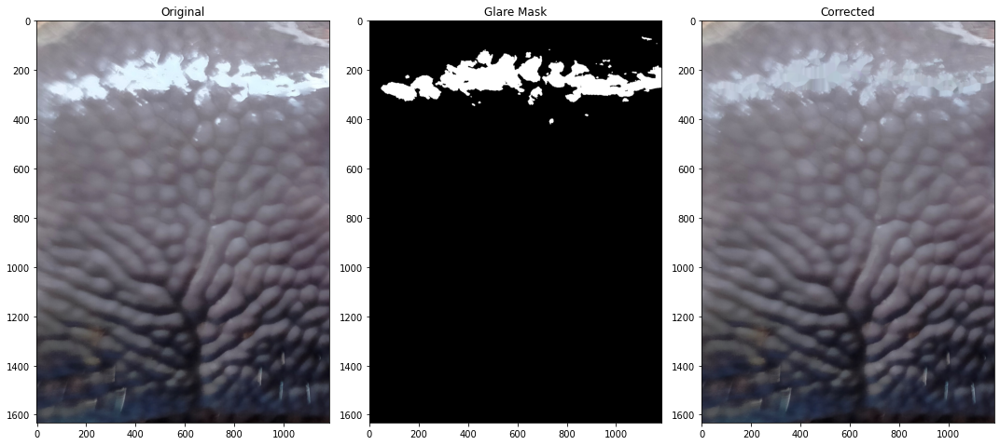

In [ ]:
corrected = cv2.inpaint(image_in,glare,5,cv2.INPAINT_NS)
# cv2.INPAINT_TELEA
# corrected = cv2.inpaint(image_in,glare,5,cv2.INPAINT_TELEA)
#plot images
plt.figure(figsize=(15,12))
plt.subplot(1,3,1)
plt.imshow(image_in)
plt.title("Original")
# plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(glare,cmap = "gray")
# plt.axis("off")
plt.title("Glare Mask")

plt.subplot(1,3,3)
plt.imshow(corrected,cmap = "gray")
plt.title("Corrected")


plt.tight_layout()
plt.show() 

